# Relative energies of conformations 
## (by Boltzmann distribution)
## of malic acid and malate anion

In [1]:
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.signal import argrelextrema
from scipy.optimize import least_squares

## (I) Conformations of malate anion

In [2]:
anion = pd.read_csv('data/dihedrals-malate-anion.tsv',
                        delimiter='\t', header=None,
                        index_col=0, names=[None, 'angle'])

### 1) Bring angles to $[0..360^\circ]$ and sort

In [3]:
anion.angle = anion.angle.mod(360)
anion.sort_values('angle', inplace=True)

### 2) Plot scatter diagram

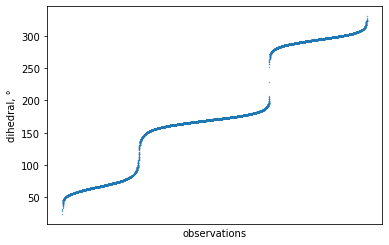

In [4]:
plt.scatter(range(len(anion.angle)), anion.angle, s=.1)
plt.ylabel('dihedral, °')
plt.xlabel('observations')
plt.tick_params(
    axis='x',
    which='both',
    bottom=False,
    top=False,
    labelbottom=False
)

plt.show()

### 3) Plot histogram and kernel density estimation

/usr/local/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.9/site-packages/seaborn/distributions.py:1657: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.1 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


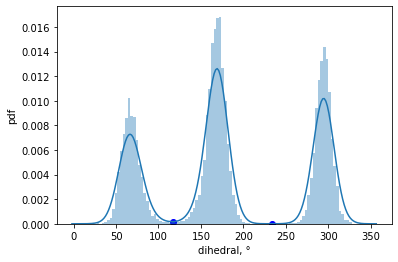

In [5]:
# histogram + pdf
smooth_hitogram = sns.distplot(anion.angle,
                              kde_kws={'bw': .1},
                              bins=100)
# isolate pdf
x, y = smooth_hitogram.get_lines()[0].get_data()

# find local minima
argmin = argrelextrema(y, np.less)

# scatter
plt.scatter(x[argmin], y[argmin], color='b', alpha=1)

plt.xlabel('dihedral, °')
plt.ylabel('pdf')
plt.show()

### 4) Calculate the probability of conformations

In [6]:
# ascribe angle ranges to conformations
def switch(angle):
    if 0 < angle < x[argmin][0]:
        return 'gauche(+)'
    elif angle < x[argmin][1]:
        return 'trans'
    else:
        return 'gauche(-)'

In [7]:
# determine the conformation and its a posteriori probability
anion_popul = anion.angle.apply(switch).value_counts().pipe(lambda x: x / x.sum())
anion_popul

trans        0.428490
gauche(-)    0.320323
gauche(+)    0.251187
Name: angle, dtype: float64

### 5) Calculate the relative energy of conformations

### Boltzmann distribution
$$\dfrac{N_i}{N} = \dfrac{\exp(-\beta E_i)}{\sum \limits_j \exp(-\beta E_j)}, \quad \beta = \dfrac{1}{k T}$$

In [8]:
def bolzmann(energy, T=298.15):
    # Hereinafter, the energy is in inverse centimeters
    energy = np.array(energy)
    coef = 1.44  
    series = np.exp(-coef * energy / T) 
    return series / series.sum()

Solve system: find the energy values $E_i$ for the given populations $p_i = \dfrac{N_i}{N}$, minimizing the quadratic residual:
$$ Q(E_{(i)}) = \sum_i \left(\dfrac{\exp(-\beta E_i)}{\sum \limits_j \exp(-\beta E_j)} - p_i^\text{calc} \right)^2 \to \min_{E_{(i)}}$$

In [9]:
def calc_relative_energy(popul, T=298.16):
    energy0 = [1, 2, 3]
    energy = least_squares(lambda es: bolzmann(es, T=T) - popul, energy0, bounds=(0, np.inf)).x
    energy = energy - energy.min()
    
    if isinstance(popul, pd.Series):
        return pd.Series(energy, index=popul.index)
    return list(energy)

In [10]:
anion_rel_energy = calc_relative_energy(anion_popul)
anion_rel_energy

trans          0.000000
gauche(-)     60.240452
gauche(+)    110.582731
dtype: float64

## (II) Let's do it the same way for protonated form

In [11]:
acid = pd.read_csv('data/dihedrals-malic-acid.tsv',
                        delimiter='\t', header=None,
                        index_col=0, names=[None, 'angle'])

In [12]:
acid.angle = acid.angle.mod(360)
acid.sort_values('angle', inplace=True)

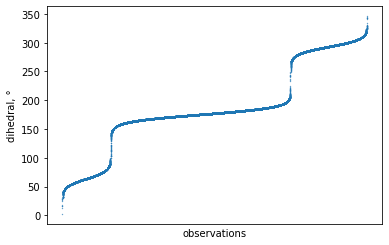

In [13]:
plt.scatter(range(len(acid.angle)), acid.angle, s=.1)
plt.ylabel('dihedral, °')
plt.xlabel('observations')
plt.tick_params(
    axis='x',
    which='both',
    bottom=False,
    top=False,
    labelbottom=False)

plt.show()

/usr/local/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.9/site-packages/seaborn/distributions.py:1657: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.1 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


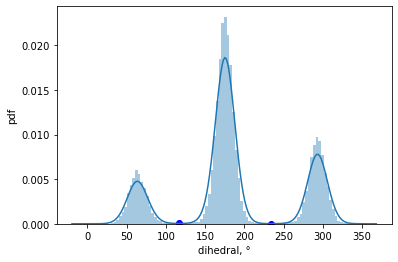

In [14]:
# histogram + pdf
smooth_hitogram = sns.distplot(acid.angle,
                              kde_kws={'bw': .1},
                              bins=100)
x, y = smooth_hitogram.get_lines()[0].get_data()
argmin = argrelextrema(y, np.less)
plt.scatter(x[argmin], y[argmin], color='b', alpha=1)
plt.xlabel('dihedral, °')
plt.ylabel('pdf')
plt.show()

In [15]:
acid_popul = acid.angle.apply(switch).value_counts().pipe(lambda x: x / x.sum())
acid_popul

trans        0.590360
gauche(-)    0.250948
gauche(+)    0.158692
Name: angle, dtype: float64

In [16]:
acid_rel_energy = calc_relative_energy(acid_popul)
acid_rel_energy

trans          0.000000
gauche(-)    177.132807
gauche(+)    272.022859
dtype: float64

## (III) Results

### Energy calculation based on experimental population data

In [17]:
# Anion conformations
calc_relative_energy([60, 37, 3])

[0.0, 3533.0233899071586, 3550.267267167876]

In [18]:
# Acid conformations
calc_relative_energy([51, 42, 7])

[0.0, 3077.7549490018255, 3514.8355463528055]

### Scatter plots

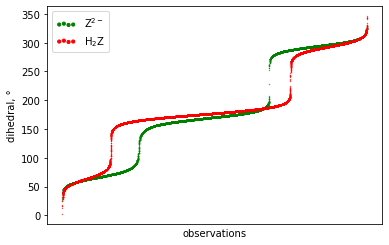

In [19]:

plt.scatter(range(len(anion.angle)), anion.angle, s=.1,
            c='g', label=r'$\mathsf{Z^{2-}}$')
plt.scatter(np.linspace(1, len(anion.angle), num=len(acid.angle)), acid.angle,
            s=.1, c='r',
            label=r'$\mathsf{H_2Z}$')

plt.ylabel('dihedral, °')
plt.xlabel('observations')
plt.legend(scatterpoints=4, markerscale=10)

plt.tick_params(
    axis='x',
    which='both',
    bottom=False,
    top=False,
    labelbottom=False)

plt.show()